In [63]:
import os
import cv2
import keras
import numpy as np
from glob import glob
import tensorflow as tf
import matplotlib.pyplot as plt

from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, concatenate, BatchNormalization, Activation, Dropout, MaxPooling2D, UpSampling2D,LeakyReLU,ZeroPadding2D,multiply
from tensorflow.keras.models import Model
from tensorflow.keras.applications import Xception
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.metrics import Recall, Precision
from tensorflow.keras import backend as K

from tensorflow.keras.layers import LeakyReLU

from keras.layers import Activation, SpatialDropout2D
from keras.layers import Input,Dropout,BatchNormalization,Activation,Add
from keras.layers import Dense, Lambda
from keras.layers import concatenate, add
from keras.layers import GlobalAveragePooling2D, Reshape, Dense, multiply, Permute
from keras.optimizers import SGD
# from keras.preprocessing.image import ImageDataGenerator


AUTOTUNE = tf.data.experimental.AUTOTUNE
print(f"Tensorflow ver. {tf.__version__}")

Tensorflow ver. 2.16.1


In [73]:
# Input image size that we are going to use
IMAGE_SIZE = 512
num_classes = 4
# Set batch size
batch = 16
# Set learning rate
LR = 1e-4
# Set epoch
EPOCHS = 100

In [4]:
# Set image and mask paths
image_path = "../../Datasets/IE-dataset-All-tts-augmented/images/"
mask_path = "../../Datasets/IE-dataset-All-tts-augmented/masks/"
training_data = "train/"
val_data = "validation/"
test_data = "test/"

In [5]:
# Function to create lists of paths for training, validation and testing data
def load_data():
  extensions = ["*.jpg", "*.tif", "*.tiff"]
  file_patterns = [os.path.join(image_path, training_data, ext) for ext in extensions]

  TRAIN_X = sorted(sum((glob(pattern) for pattern in file_patterns), []))
  # TRAIN_X = sorted(glob(os.path.join(image_path + training_data, "*.jpg")))
  train_x = TRAIN_X
# image_path
  TRAIN_Y = sorted(glob(os.path.join(mask_path + training_data, "*.png")))
  train_y = TRAIN_Y

  file_patterns = [os.path.join(image_path, val_data, ext) for ext in extensions]
  VALID_TEST_X = sorted(sum((glob(pattern) for pattern in file_patterns), []))
  # VALID_TEST_X = sorted(glob(os.path.join(image_path + val_data, "*.jpg")))
  valid_x = VALID_TEST_X

  VALID_TEST_Y = sorted(glob(os.path.join(mask_path + val_data, "*.png")))
  valid_y = VALID_TEST_Y

  file_patterns = [os.path.join(image_path, test_data, ext) for ext in extensions]
  TEST_X = sorted(sum((glob(pattern) for pattern in file_patterns), []))
  test_x = TEST_X
  TEST_Y = sorted(glob(os.path.join(mask_path + test_data, "*.png")))
  test_y = TEST_Y

  return (train_x, train_y), (valid_x, valid_y), (test_x, test_y)

In [6]:
(train_x, train_y), (valid_x, valid_y), (test_x, test_y) = load_data()

print("Training data: ", len(train_x))
print("Validation data: ", len(valid_x))
print("Test data: ", len(test_x))

Training data:  308
Validation data:  16
Test data:  15


In [7]:
# Set image augmentation (to be called by tensorflow dataset later)
data_augmentation = tf.keras.Sequential([
  # layers.RandomFlip("horizontal_and_vertical"),
  # layers.RandomRotation(0.2),
  # layers.RandomZoom(.5, .2),
  # layers.RandomContrast(0.1)
  ],
  )

In [8]:
# Functions to read image and mask paths to output numpy arrays
def read_image(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_COLOR)
    x = cv2.resize(x, (IMAGE_SIZE, IMAGE_SIZE))
    x = x/255.0
    return x

def read_mask(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    x = cv2.resize(x, (IMAGE_SIZE, IMAGE_SIZE))
    x = np.expand_dims(x, axis=-1)
    return x

In [112]:
# Function to generate tensorflow dataset 
def tf_parse(x, y):
    def _parse(x, y):
        x = read_image(x)
        y = read_mask(y)
        return x, y

    x, y = tf.numpy_function(_parse, [x, y], [tf.float64, tf.uint8])
    x.set_shape([IMAGE_SIZE, IMAGE_SIZE, 3])
    y.set_shape([IMAGE_SIZE, IMAGE_SIZE, 1])
    return x, y

num_threads = 4

def tf_dataset_train(x, y, batch=batch):
    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    dataset = dataset.shuffle(buffer_size=5000)
    dataset = dataset.repeat()
    dataset = dataset.map(tf_parse, num_parallel_calls=num_threads)
    dataset = dataset.batch(batch)
    # newdataset = dataset.map(lambda x, y: (data_augmentation(x, training=True), y), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.prefetch(1)
    return dataset
    


def tf_dataset_valid(x, y, batch=batch):
    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    dataset = dataset.shuffle(buffer_size=500)
    dataset = dataset.repeat()
    dataset = dataset.map(tf_parse, num_parallel_calls=num_threads)
    dataset = dataset.batch(batch)
    dataset = dataset.prefetch(1)
    return dataset

def tf_dataset_test(x, y):
    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    dataset = dataset.map(tf_parse, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    # dataset = dataset.batch(batch)
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
    return dataset


In [113]:
train_dataset = tf_dataset_train(train_x, train_y)
valid_dataset = tf_dataset_valid(valid_x, valid_y)
test_dataset = tf_dataset_test(test_x, test_y)

In [11]:
# Function to load image/mask and convert colour space from BGR to RGB so that image/mask can be displayed correctly by matplotlib
def read_and_rgb(x):
    x = cv2.imread(x)
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
    return x

In [12]:
# Function for conv2d_block (to be used for building decoder of unet)
def conv2d_block(input_tensor, n_filters, kernel_size = 3, batchnorm = True):
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size), kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    return x

In [42]:
# Function for unet model creation
def unet(n_filters = 16, batchnorm = True, dropout = 0.1, num_classes=4):

    # Contracting Path (encoder)
    inputs = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="input_image")
    encoder = Xception(input_tensor=inputs, include_top=False,weights="imagenet")
    # BASE_WEIGHT_PATH = ('https://github.com/fchollet/deep-learning-models/releases/download/v0.1/')
    # model_name = 'resnet50_weights_tf_dim_ordering_tf_kernels.h5'
    # weight_path = BASE_WEIGHT_PATH + model_name
    # weights_path = keras.utils.get_file(model_name, weight_path)
    # encoder.load_weights(weights_path, by_name=True, skip_mismatch=True)

    skip_connection_names = ["block1_conv1_bn", "block4_sepconv2_bn", "block3_sepconv2_bn", "block4_sepconv2_bn","block13_sepconv2_bn"]
    encoder_output = encoder.get_layer("block14_sepconv2_act").output

    x = encoder_output
    x_skip_1 = encoder.get_layer(skip_connection_names[-1]).output # 224x224
    x_skip_2 = encoder.get_layer(skip_connection_names[-2]).output # 112x112
    x_skip_3 = encoder.get_layer(skip_connection_names[-3]).output # 56x56
    x_skip_4 = encoder.get_layer(skip_connection_names[-4]).output # 28x28
    x_skip_5 = encoder.get_layer(skip_connection_names[-5]).output # 14x14


    # Expansive Path (decoder)
    u6 = Conv2DTranspose(n_filters * 13, (3, 3), strides = (2, 2), padding = 'same')(x)
    u6 = concatenate([u6, x_skip_1])
    c6 = conv2d_block(u6, n_filters * 13, kernel_size = 3, batchnorm = batchnorm)
    p6 = Dropout(dropout)(c6)

    u7 = Conv2DTranspose(n_filters * 12, (3, 3), strides = (2, 2), padding = 'same')(c6)
    u7 = concatenate([u7, x_skip_2])
    c7 = conv2d_block(u7, n_filters * 12, kernel_size = 3, batchnorm = batchnorm)
    p7 = Dropout(dropout)(c7)

    u8 = Conv2DTranspose(n_filters * 11, (3, 3), strides = (2, 2), padding = 'same')(p7)
    u8 = concatenate([u8, x_skip_3])
    c8 = conv2d_block(u8, n_filters * 11, kernel_size = 3, batchnorm = batchnorm)
    p7 = Dropout(dropout)(c8)

    u9 = Conv2DTranspose(n_filters * 10, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = concatenate([u9, x_skip_4])
    c9 = conv2d_block(u9, n_filters * 10, kernel_size = 3, batchnorm = batchnorm)
    
    u10 = Conv2DTranspose(n_filters * 9, (3, 3), strides = (2, 2), padding = 'same')(c9)
    u10 = concatenate([u10, x_skip_5])
    c10 = conv2d_block(u10, n_filters * 9, kernel_size = 3, batchnorm = batchnorm)
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(c10)

    model = Model(inputs=inputs, outputs=encoder_output)
    
    return model

In [44]:
def convolution_block(x, filters, size, strides=(1,1), padding='same', activation=True):
    x = Conv2D(filters, size, strides=strides, padding=padding)(x)
    x = BatchNormalization()(x)
    if activation == True:
        x = LeakyReLU(alpha=0.1)(x)
    return x

def residual_block(blockInput, num_filters=16):
    x = LeakyReLU(alpha=0.1)(blockInput)
    x = BatchNormalization()(x)
    blockInput = BatchNormalization()(blockInput)
    x = convolution_block(x, num_filters, (3,3) )
    x = convolution_block(x, num_filters, (3,3), activation=False)
    x = Add()([x, blockInput])
    return x

In [80]:
def UXception(input_shape=(None, None, 3),dropout_rate=0.5):

    backbone = Xception(input_shape=input_shape,weights='imagenet',include_top=False)
    input = backbone.input
    start_neurons = 16

    conv4 = backbone.layers[121].output
    conv4 = LeakyReLU(alpha=0.1)(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(dropout_rate)(pool4)
    
     # Middle
    convm = Conv2D(start_neurons * 32, (3, 3), activation=None, padding="same")(pool4)
    convm = residual_block(convm,start_neurons * 32)
    convm = residual_block(convm,start_neurons * 32)
    convm = LeakyReLU(alpha=0.1)(convm)
    
    deconv4 = Conv2DTranspose(start_neurons * 16, (3, 3), strides=(2, 2), padding="same")(convm)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(dropout_rate)(uconv4)
    
    uconv4 = Conv2D(start_neurons * 16, (3, 3), activation=None, padding="same")(uconv4)
    uconv4 = residual_block(uconv4,start_neurons * 16)
    uconv4 = residual_block(uconv4,start_neurons * 16)
    uconv4 = LeakyReLU(alpha=0.1)(uconv4)
    
    deconv3 = Conv2DTranspose(start_neurons * 8, (3, 3), strides=(2, 2), padding="same")(uconv4)
    conv3 = backbone.layers[31].output
    uconv3 = concatenate([deconv3, conv3])    
    uconv3 = Dropout(dropout_rate)(uconv3)
    
    uconv3 = Conv2D(start_neurons * 8, (3, 3), activation=None, padding="same")(uconv3)
    uconv3 = residual_block(uconv3,start_neurons * 8)
    uconv3 = residual_block(uconv3,start_neurons * 8)
    uconv3 = LeakyReLU(alpha=0.1)(uconv3)

    deconv2 = Conv2DTranspose(start_neurons * 4, (3, 3), strides=(2, 2), padding="same")(uconv3)
    conv2 = backbone.layers[21].output
    conv2 = ZeroPadding2D(((1,0),(1,0)))(conv2)
    uconv2 = concatenate([deconv2, conv2])
        
    uconv2 = Dropout(0.1)(uconv2)
    uconv2 = Conv2D(start_neurons * 4, (3, 3), activation=None, padding="same")(uconv2)
    uconv2 = residual_block(uconv2,start_neurons * 4)
    uconv2 = residual_block(uconv2,start_neurons * 4)
    uconv2 = LeakyReLU(alpha=0.1)(uconv2)
    
    deconv1 = Conv2DTranspose(start_neurons * 2, (3, 3), strides=(2, 2), padding="same")(uconv2)
    conv1 = backbone.layers[11].output
    conv1 = ZeroPadding2D(((3,0),(3,0)))(conv1)
    uconv1 = concatenate([deconv1, conv1])
    
    uconv1 = Dropout(0.1)(uconv1)
    uconv1 = Conv2D(start_neurons * 2, (3, 3), activation=None, padding="same")(uconv1)
    uconv1 = residual_block(uconv1,start_neurons * 2)
    uconv1 = residual_block(uconv1,start_neurons * 2)
    uconv1 = LeakyReLU(alpha=0.1)(uconv1)
    
    uconv0 = Conv2DTranspose(start_neurons * 1, (3, 3), strides=(2, 2), padding="same")(uconv1)   
    uconv0 = Dropout(dropout_rate)(uconv0)
    uconv0 = Conv2D(start_neurons * 1, (3, 3), activation=None, padding="same")(uconv0)
    uconv0 = residual_block(uconv0,start_neurons * 1)
    uconv0 = residual_block(uconv0,start_neurons * 1)
    uconv0 = LeakyReLU(alpha=0.1)(uconv0)
    
    uconv0 = Dropout(dropout_rate/2)(uconv0)
    output_layer = Conv2D(4, (1,1), padding="same", activation="softmax")(uconv0)    
    
    model = Model(input, output_layer)
    model.name = 'u-xception'

    return model


In [81]:
model = UXception(input_shape=(IMAGE_SIZE,IMAGE_SIZE,3))
#https://www.kaggle.com/code/meaninglesslives/unet-xception-keras-for-pneumothorax-segmentation#Useful-Model-Blocks

In [ ]:
# model = unet(n_filters = 16, batchnorm = True, dropout = 0.1, num_classes=4)

In [15]:
# tf.keras.utils.plot_model(model,show_shapes=True)

In [82]:
# Specify all the encoder layers in a list
encoder_layers = model.layers[0:-140]

In [83]:
# Freeze the encoder layers for transfer learning (so that weights are only Augmentedchanged for the decoder layers druing training)
for layer in encoder_layers:
    layer.trainable = False
    # print(layer, layer.trainable)

In [84]:
model.summary()

Model: "u-xception"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 255, 255,  │        864 │ input_layer_4[0]… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 255, 255,  │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 255, 255,  │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 253, 253,  │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 253, 253,  │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 253, 253,  │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 253, 253,  │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 253, 253,  │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 253, 253,  │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 253, 253,  │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 253, 253,  │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_139 (Conv2D) │ (None, 127, 127,  │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 127, 127,  │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 127, 127,  │        512 │ conv2d_139[0][0]  │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_228 (Add)       │ (None, 127, 127,  │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 127, 127,  │          0 │ add_228[0][0]   

 Total params: 38,431,500 (146.60 MB)

 Trainable params: 23,059,428 (87.96 MB)

 Non-trainable params: 15,372,072 (58.64 MB)

In [85]:
# Functions for dice coefficient and dice loss 

import tensorflow.keras.backend as K

def dice_coef(y_true, y_pred, smooth=1e-7):
    y_true_f = K.flatten(K.one_hot(K.cast(y_true, 'int32'), num_classes=4)[Ellipsis,1:])
    y_pred_f = K.flatten(y_pred[...,1:])
    intersect = K.sum(y_true_f * y_pred_f, axis=-1)
    true_sum = K.sum(y_true_f , axis=-1)
    pred_sum = K.sum(y_pred_f, axis=-1)
    return K.mean((2. * intersect / (true_sum+pred_sum + smooth)))

def dice_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def mean_iou(y_true, y_pred, num_classes=4):
  smooth = 1e-7  
  y_true_f = K.flatten(K.one_hot(K.cast(y_true, 'int32'), num_classes=num_classes)[..., 1:])
  y_pred_f = K.flatten(y_pred[..., 1:])
  intersection = K.sum(K.cast(y_true_f * y_pred_f, dtype='float32'), axis=-1)
  set_sum = K.sum(K.cast(y_true_f + y_pred_f, dtype='float32'), axis=-1)
  iou = (intersection + smooth) / (set_sum -intersection+ smooth)
  mIoU = K.mean(iou)
  return mIoU

def mIoU_loss(y_true, y_pred):
    return 1 - mean_iou(y_true, y_pred)
   


In [86]:
# Set up loss function, optimiser and complile the model 
opt = tf.keras.optimizers.AdamW(LR)
metrics = [dice_coef,mean_iou]
model.compile(loss=dice_loss, optimizer=opt, metrics=metrics)
#model.compile(optimizer=opt, loss = tf.keras.losses.SparseCategoricalCrossentropy(),metrics=['accuracy'])

In [76]:
# Set up early stopping and reduce learning rate on plateau
early_stopping = EarlyStopping(
    monitor='mean_iou', 
    patience=4, 
    mode='max'
)

reduce_lr = ReduceLROnPlateau(
    monitor='mean_iou', 
    factor=0.3,   
    patience=4, 
    min_lr=0.0001,
)


In [77]:
# Set up checkpoint for saving model architecture and weights
checkpoint_filepath = 'checkpoint.model.keras'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor='mean_iou',
    mode='max',
    save_best_only=True)

In [87]:
# Commencement of training
train_steps = len(train_x)//batch
valid_steps = len(valid_x)//batch

if len(train_x) % batch != 0: 
    train_steps += 1
if len(valid_x) % batch != 0: 
    valid_steps += 1

history=model.fit(
    train_dataset,
    validation_data = valid_dataset,
    epochs=EPOCHS,
    steps_per_epoch=train_steps,
    validation_steps=valid_steps,
    callbacks=[model_checkpoint_callback,early_stopping,reduce_lr]
)


Epoch 1/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 473s 23s/step - dice_coef: 0.2750 - loss: 0.7250 - mean_iou: 0.1599 - val_dice_coef: 0.2407 - val_loss: 0.7593 - val_mean_iou: 0.1368 - learning_rate: 1.0000e-04
Epoch 2/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 454s 23s/step - dice_coef: 0.4479 - loss: 0.5521 - mean_iou: 0.2895 - val_dice_coef: 0.4133 - val_loss: 0.5867 - val_mean_iou: 0.2605 - learning_rate: 1.0000e-04
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 455s 23s/step - dice_coef: 0.5609 - loss: 0.4391 - mean_iou: 0.3911 - val_dice_coef: 0.4971 - val_loss: 0.5029 - val_mean_iou: 0.3307 - learning_rate: 1.0000e-04
Epoch 4/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 454s 23s/step - dice_coef: 0.6339 - loss: 0.3661 - mean_iou: 0.4652 - val_dice_coef: 0.5100 - val_loss: 0.4900 - val_mean_iou: 0.3423 - learning_rate: 1.0000e-04
Epoch 5/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 455s 23s/step - dice_coef: 0.6642 - loss: 0.3358 - mean_iou: 0.4989 - val_dice_coef: 0.5352 - val_loss: 0.4648 - val_mean_iou: 0.3653 - learning_rate: 1.0000

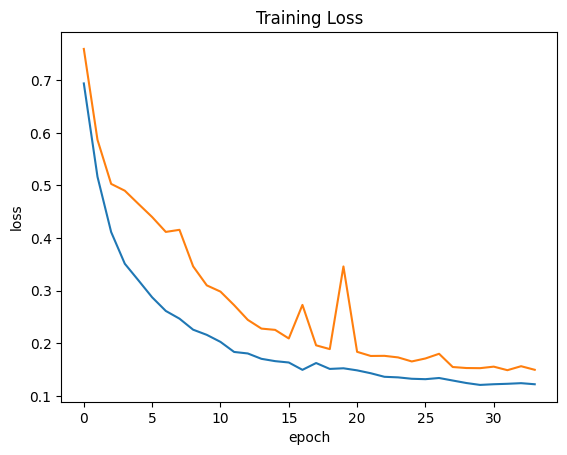

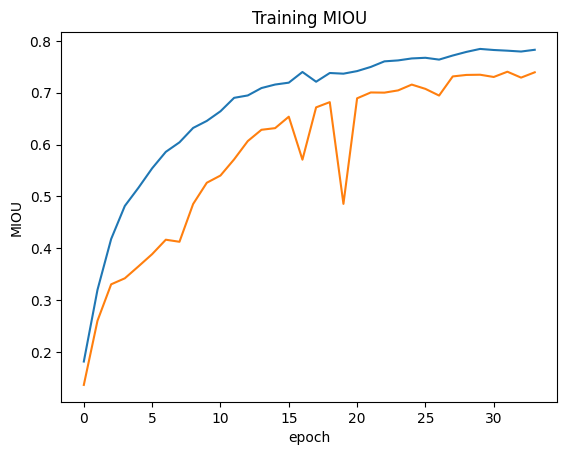

In [88]:
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.title("Training Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()
plt.plot(history.history["mean_iou"])
plt.plot(history.history["val_mean_iou"])
plt.title("Training MIOU")
plt.ylabel("MIOU")
plt.xlabel("epoch")
plt.show()

In [173]:
def mean_iouTEST(y_true, y_pred, num_classes=4):
  smooth = 1e-7  
  y_true_f = K.flatten(K.one_hot(K.cast(y_true, 'int32'), num_classes=num_classes)[..., 1:])
  y_pred_f = K.flatten(K.one_hot(K.cast(y_pred, 'int32'), num_classes=num_classes)[..., 1:])
  # y_pred_f = K.flatten(y_pred[..., 1:])
  intersection = K.sum(K.cast(y_true_f * y_pred_f, dtype='float32'), axis=-1)
  set_sum = K.sum(K.cast(y_true_f + y_pred_f, dtype='float32'), axis=-1)
  iou = (intersection + smooth) / (set_sum -intersection+ smooth)
  mIoU = K.mean(iou)
  return mIoU.numpy()

In [149]:
def display_sample(sample_image,sample_mask_seperated,pred_mask_seperated):
    # plt.figure(figsize=(16, 16))
    title = ['bg','fat','cell','bone']
    # for i in range(len(display_list)):
    #     plt.subplot(1, len(display_list), i+1)
    #     plt.title(title[i])
    #     plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]),cmap='gray')
    #     plt.axis('off')
    # plt.show()

    fig,axs=plt.subplots(2,5,figsize=(30,12))
    axs[0][0].imshow(sample_image)
    axs[0][0].axis('off')
    axs[0][0].set_title('Original Image')
    for i in range(4):
        axs[0][i+1].imshow(sample_mask_seperated[i],cmap='gray')
        axs[0][i+1].axis('off')
        axs[0][i+1].set_title(f'Original {title[i]}')
    for i in range(4):
        axs[1][i+1].imshow(pred_mask_seperated[i],cmap='gray')
        axs[1][i+1].axis('off')
        axs[1][i+1].set_title(f'Predicted {title[i]}')
    plt.show()

In [187]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1) 
    pred_mask = tf.expand_dims(pred_mask, axis=-1)
    return pred_mask
    
def show_predictions(sample_image,sample_mask):
    one_img = sample_image[0][tf.newaxis, ...] 
    prediction = model.predict(one_img)
    pred_mask = create_mask(prediction)
    miou=mean_iouTEST(sample_mask[0],pred_mask)

    sample_mask_seperated=[(sample_mask[0]==i) for i in [0,1,2,3]]
    pred_mask_seperated=[(pred_mask[0]==i) for i in [0,1,2,3]]

    display_sample(sample_image[0], sample_mask_seperated,pred_mask_seperated)#sample_mask_seperated, pred_mask_seperated)
    
    fat_true=np.sum(sample_mask_seperated[1])
    cell_true=np.sum(sample_mask_seperated[2])
    fat_pred=np.sum(pred_mask_seperated[1])
    cell_pred=np.sum(pred_mask_seperated[2])
    cellularity_true=(cell_true*100)/(cell_true+fat_true)
    cellularity_pred=(cell_pred*100)/(cell_pred+fat_pred)
    cellularity_accuracy=(1-abs(cellularity_pred-cellularity_true)/100)*100
    print(f"mIoU={miou*100:.3f}%\tcellulu true={cellularity_true:.3f}%\tcellulu pred={cellularity_pred:.3f}%\tDifference={cellularity_accuracy:.3f}%")
    return cellularity_accuracy,miou*100

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


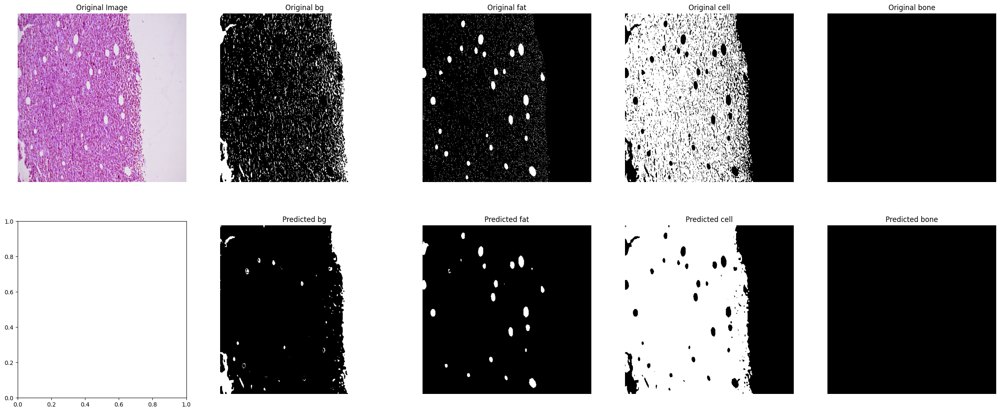

mIoU=80.079%	cellulu true=91.724%	cellulu pred=97.254%	Difference=94.470%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


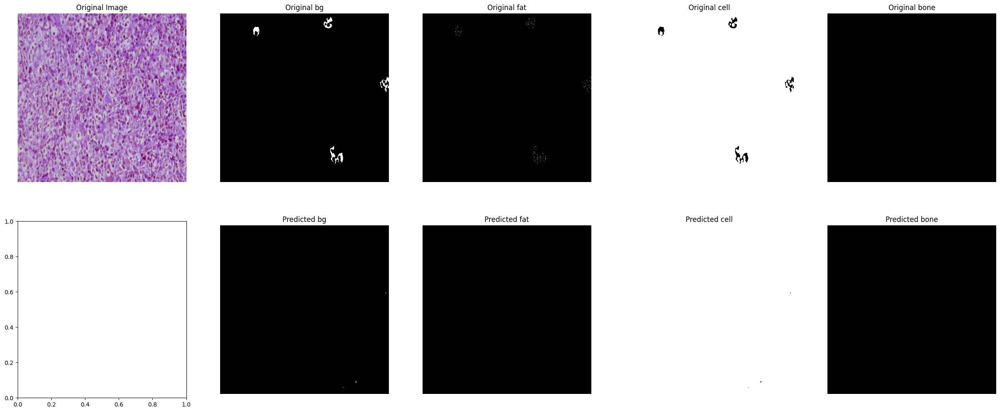

mIoU=99.224%	cellulu true=99.937%	cellulu pred=100.000%	Difference=99.937%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


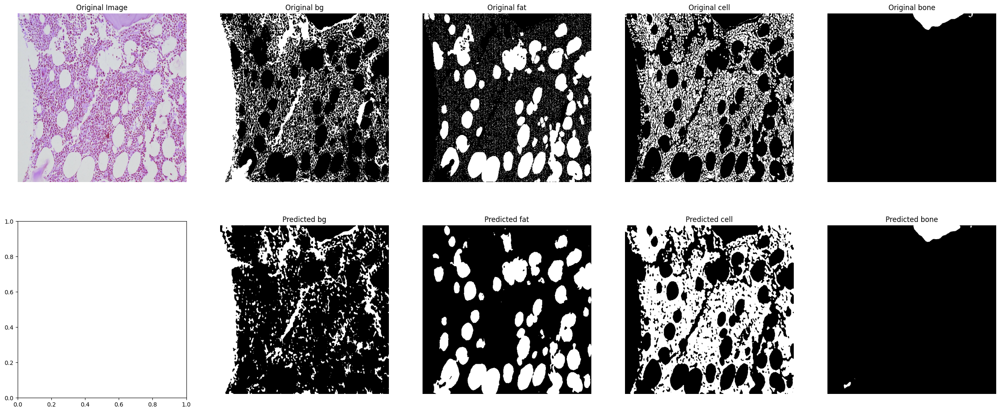

mIoU=66.082%	cellulu true=50.845%	cellulu pred=64.325%	Difference=86.520%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


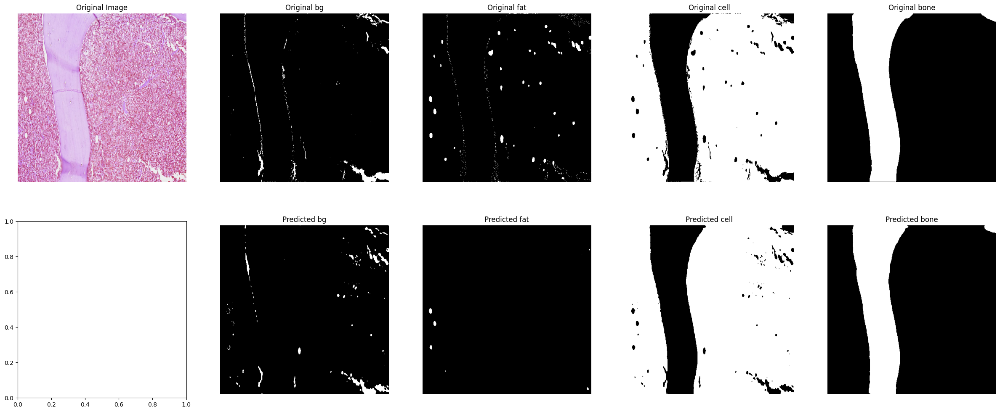

mIoU=95.791%	cellulu true=98.218%	cellulu pred=99.829%	Difference=98.389%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


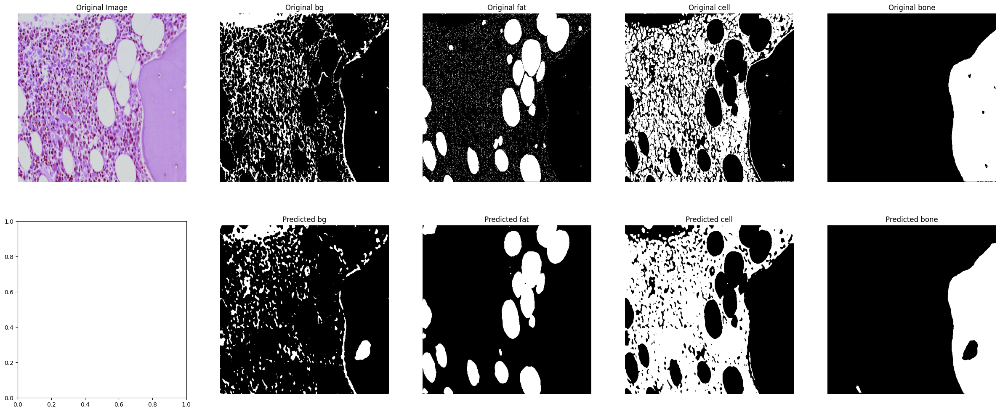

mIoU=79.222%	cellulu true=65.769%	cellulu pred=74.765%	Difference=91.004%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


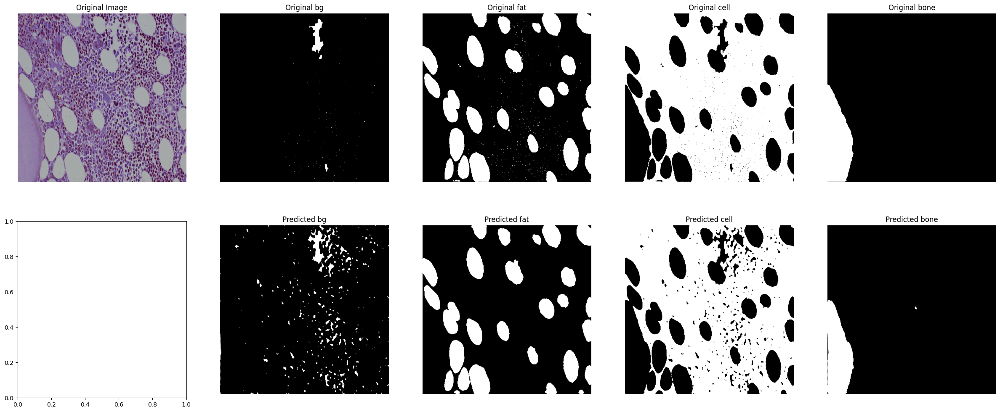

mIoU=94.498%	cellulu true=77.484%	cellulu pred=77.138%	Difference=99.654%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


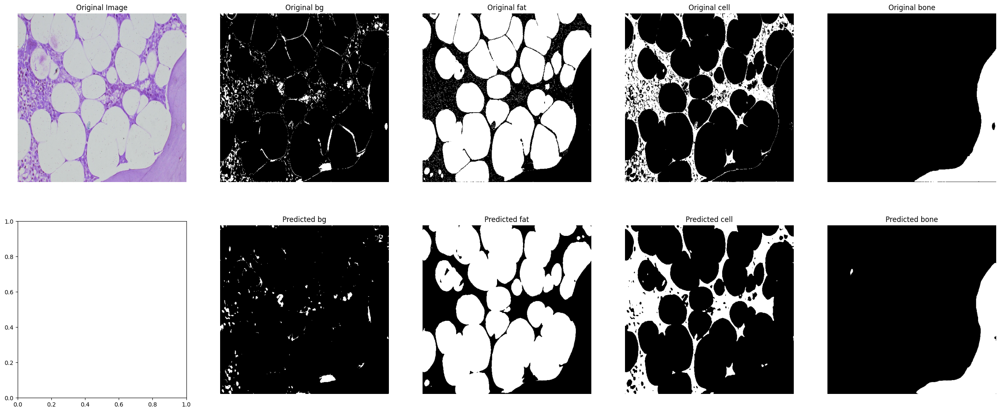

mIoU=91.264%	cellulu true=23.052%	cellulu pred=24.974%	Difference=98.078%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


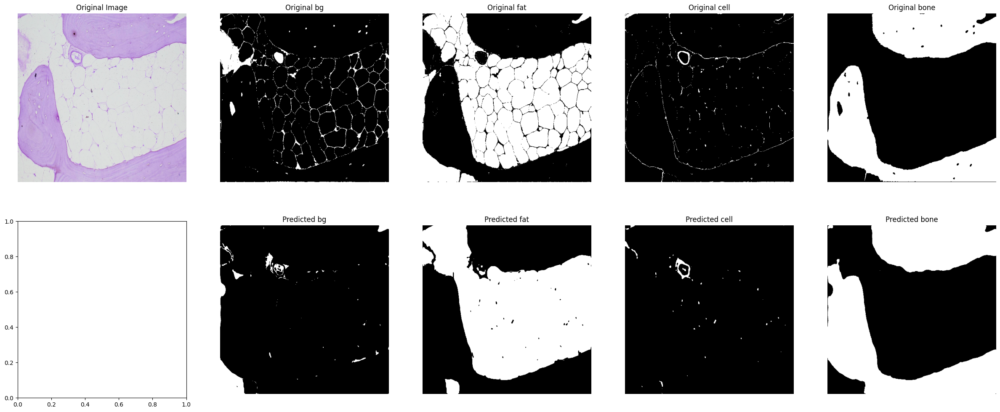

mIoU=85.716%	cellulu true=2.677%	cellulu pred=1.300%	Difference=98.622%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


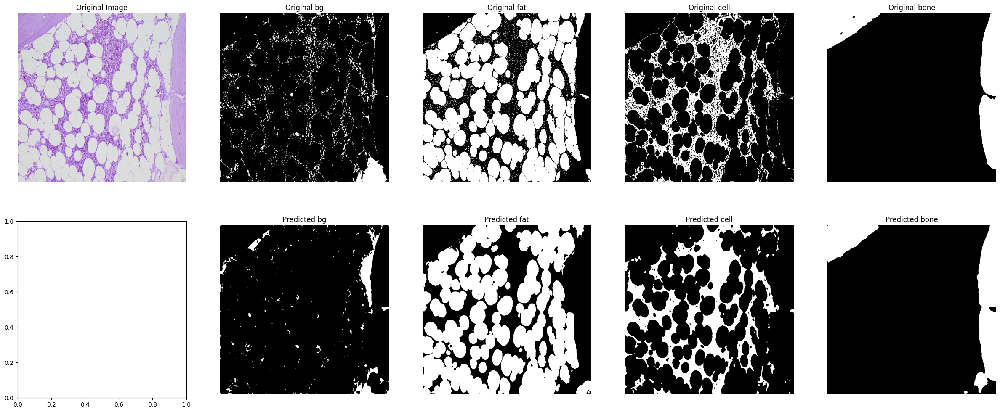

mIoU=83.107%	cellulu true=25.452%	cellulu pred=30.512%	Difference=94.939%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


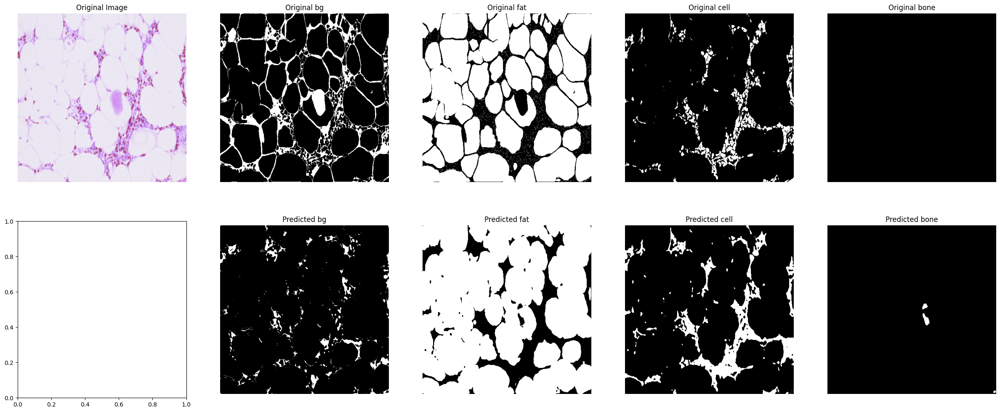

mIoU=84.948%	cellulu true=9.352%	cellulu pred=13.342%	Difference=96.011%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


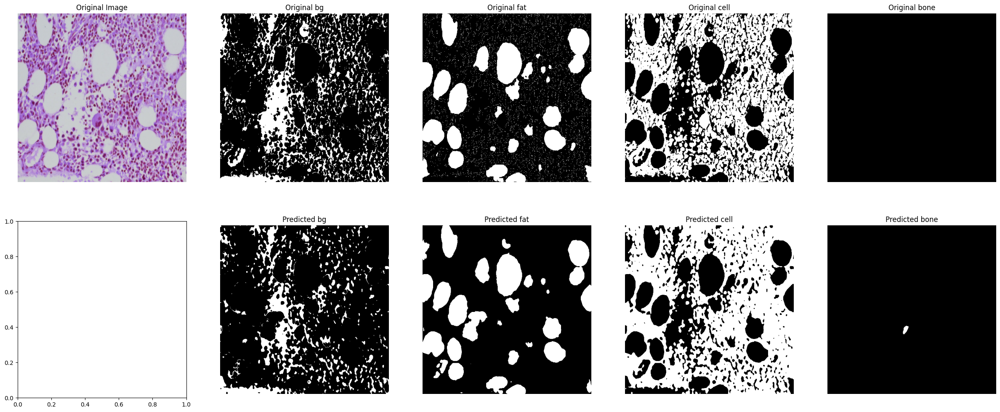

mIoU=80.666%	cellulu true=68.753%	cellulu pred=73.204%	Difference=95.549%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


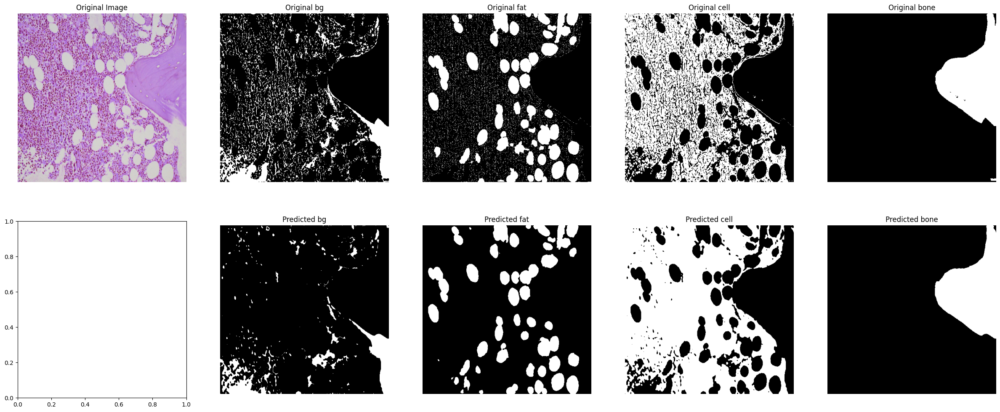

mIoU=78.044%	cellulu true=68.499%	cellulu pred=78.125%	Difference=90.374%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


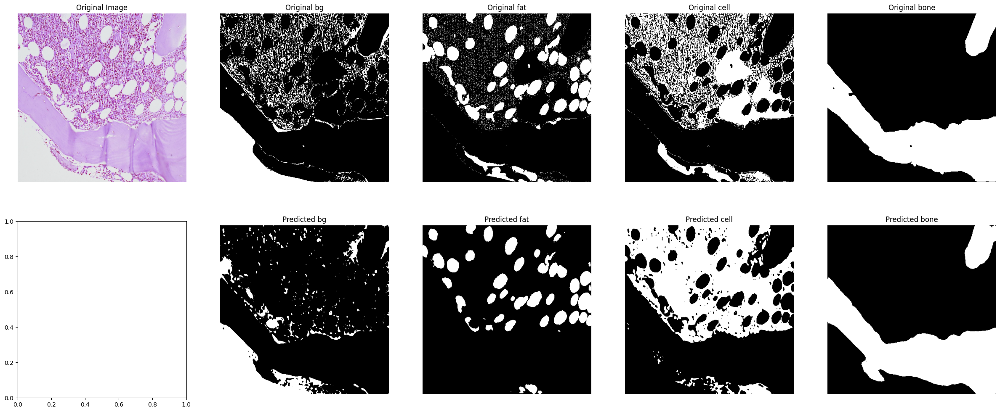

mIoU=74.092%	cellulu true=62.413%	cellulu pred=76.848%	Difference=85.565%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


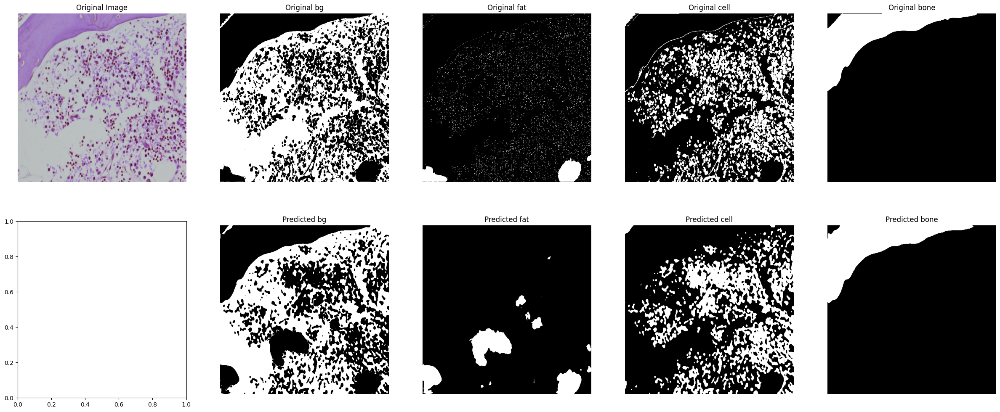

mIoU=67.232%	cellulu true=84.041%	cellulu pred=80.524%	Difference=96.483%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


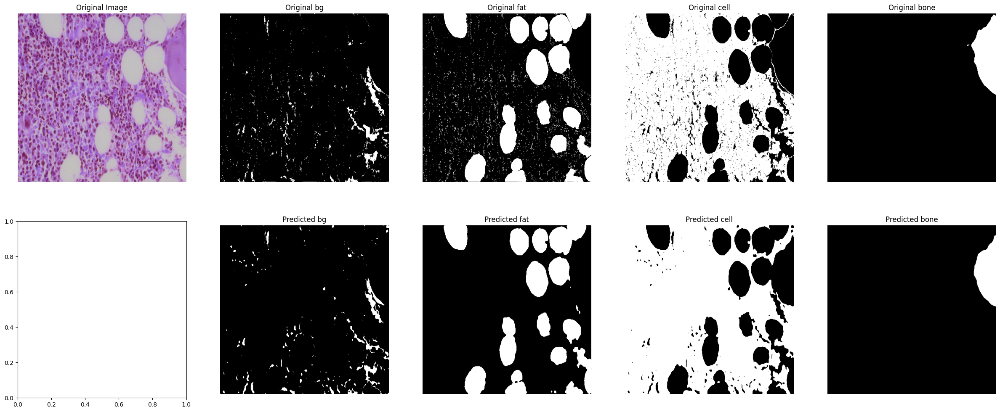

mIoU=90.159%	cellulu true=75.874%	cellulu pred=78.614%	Difference=97.260%


2024-05-29 13:22:18.847119: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [188]:
# for i in range(15):
def tf_dataset_test(x, y):
    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    dataset = dataset.map(tf_parse, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset=dataset.repeat()
    dataset = dataset.batch(batch)
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
    return dataset
    
test_dataset = tf_dataset_test(test_x, test_y)

net_cellulu=[]
net_miou=[]
totalMasks=15

for image, mask in test_dataset.take(15):
        sample_image, sample_mask = image, mask
        cellulu,miou=show_predictions(sample_image, sample_mask)
        net_cellulu.append(cellulu)
        net_miou.append(miou)

In [189]:
test_steps = len(test_x)//batch
if len(test_x) % batch != 0: 
    test_steps += 1

result = model.evaluate(test_dataset, steps=test_steps)
dict(zip(model.metrics_names, result))
print(f"Testing Cellularity Accuracy={np.mean(net_cellulu):.3f}%\tStandard Deviation: {np.std(net_cellulu):.3f}")
print(f"Testing mean_iou Standard Deviation: {np.std(net_miou):.3f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - dice_coef: 0.9026 - loss: 0.0974 - mean_iou: 0.8225
Testing Cellularity Accuracy=94.857%	Standard Deviation: 4.374
Testing mean_iou Standard Deviation: 9.504


In [93]:
# model.save('model_saves/VGG16_256.h5')  # Saves in the older HDF5 format
model.save('../../kerasModels/model_saves/Xception_512.keras')  # Recommended format (uses ZIP archive)